#  CS-503. Reinforcement Learning

This project is to demonstrate how to use Habitat-Sim simulator and Habitat-Lab library for training agents, using Policy Gradient (REINFORCE) and Proximal Policy Optimization (PPO) algorithms. 

Different combiniations of perception modalities are considered and compared for the indoor goal position navigation task, including visual signals (RGB & Depth) and coordination signals (GPS & Compass).

# Setup


### Install dependencies
Install Miniconda, Python, Habitat-Sim, Habitat-Lab, and Habitat-Baselines.

In [1]:
# Uncomment the following lines to install the required packages
# !bash ./init.sh

Click **Kernel -> Change kernel -> habitat** to activate the corresponding kernel.

### Download
Please use download the `data` folder from Google Drive [[Link](https://drive.google.com/drive/folders/1r2s8LJnHB8kHxLLacHd_TZOY6CWxUr77?usp=share_link)] and place it at the same level of this notebook. The resulting file structure should be
```text
├── CS-503-RL
│   ├── CS-503-RL.ipynb
│   ├── data
│   │   ├── checkpoints
│   │   ├── datasets
│   │   ├── scene_datasets
├── habitat-sim
└── haibtat-lab
```

In [2]:
import seaborn as sns
import matplotlib
matplotlib.rcParams["figure.dpi"] = 100
sns.set_style("whitegrid")


# Habitat Simulator
There are two important components of Habitat:
1. [Habitat-Sim](https://github.com/facebookresearch/habitat-sim), a simulator with photo-realistic rendering and rigid-body mechanics,
2. [Habitat-Lab](https://github.com/facebookresearch/habitat-lab), a modular high-level library for end-to-end development in embodied AI.

# Build the first environment
There are three important components in Habitat-Sim to build:
1. multiple sensors
2. configurable embodied agents
3. scenes that can be loaded from various datasets, such as [Gibson](http://gibsonenv.stanford.edu/database/), [Matterport3D](https://niessner.github.io/Matterport/), [Habitat Matterport 3D](https://aihabitat.org/datasets/hm3d/), etc.

In [3]:
import random

from PIL import Image
%matplotlib inline
from matplotlib import pyplot as plt
import numpy as np

import habitat_sim

## Sensor configuration
One RGB sensor and one depth sensor are used, within which many properties can be customized: the sensors, such as spatial resolution, position, rotation, etc.

In [4]:
sensor_settings = {
    "height": 256, "width": 256,  # Spatial resolution of observations
    "sensor_height": 1.5,  # Height of sensors in meters, relative to the agent
}

# Create a RGB sensor configuration
rgb_sensor_spec = habitat_sim.CameraSensorSpec()
rgb_sensor_spec.uuid = "color_sensor"
rgb_sensor_spec.sensor_type = habitat_sim.SensorType.COLOR
rgb_sensor_spec.resolution = [sensor_settings["height"], sensor_settings["width"]]
rgb_sensor_spec.position = [0.0, sensor_settings["sensor_height"], 0.0]
rgb_sensor_spec.sensor_subtype = habitat_sim.SensorSubType.PINHOLE

# Create a depth sensor configuration
depth_sensor_spec = habitat_sim.CameraSensorSpec()
depth_sensor_spec.uuid = "depth_sensor"
depth_sensor_spec.sensor_type = habitat_sim.SensorType.DEPTH
depth_sensor_spec.resolution = [sensor_settings["height"], sensor_settings["width"]]
depth_sensor_spec.position = [0.0, sensor_settings["sensor_height"], 0.0]
depth_sensor_spec.sensor_subtype = habitat_sim.SensorSubType.PINHOLE

sensor_specs = [rgb_sensor_spec, depth_sensor_spec]

## Agent configuration
Specify the action space of the agent, such as the distance to move and angle to turn.
Note that the sensor configurations are contained in the agent configuration since the sensors are rigidly attached to the agent.

In [5]:
agent_settings = {
    "action_space": {
        "move_forward": 0.25, "move_backward": 0.25,  # Distance to cover in a move action in meters
        "turn_left": 30.0, "turn_right": 30,  # Angles to cover in a turn action in degrees
    }
}

# Create an agent configuration
agent_cfg = habitat_sim.agent.AgentConfiguration()
agent_cfg.action_space = {
    k: habitat_sim.agent.ActionSpec(
        k, habitat_sim.agent.ActuationSpec(amount=v)
    ) for k, v in agent_settings["action_space"].items()
}
agent_cfg.sensor_specifications = sensor_specs

## Simulator backend configuration
Finally, configure the simulator backend, such as the scene we want to use and whether to enable the physics.

In [6]:
sim_settings = {
    "default_agent": 0,  # Index of the default agent
    "scene_id": "data/scene_datasets/gibson/Cantwell.glb",  # Scene file, episode 0 in val split of Gibson
    "enable_physics": False,  # kinematics only
    "seed": 42  # used in the random navigation
}

# Create a simulator backend configuration
sim_cfg = habitat_sim.SimulatorConfiguration()
sim_cfg.scene_id = sim_settings["scene_id"]
sim_cfg.enable_physics = sim_settings["enable_physics"]

## Configuration for the simulator
Collect the configurations for the sensors, agent, and simulator backend into a configuration that can be understood by the simulator.

In [7]:
# Create a configuration for the simulator
cfg = habitat_sim.Configuration(sim_cfg, [agent_cfg])

## Create a simulator instance
Build a simulator based on the configuration

In [8]:
try:
    sim.close()
except NameError:
    pass
sim = habitat_sim.Simulator(cfg)

[15:59:37:190507]:[Metadata] AttributesManagerBase.h(380)::createFromJsonOrDefaultInternal : <Dataset>: Proposing JSON name : default.scene_dataset_config.json from original name : default| This file does not exist.
[15:59:37:197715]:[Metadata] AssetAttributesManager.cpp(123)::createObject : Asset attributes (capsule3DSolid:capsule3DSolid_hemiRings_4_cylRings_1_segments_12_halfLen_0.75_useTexCoords_false_useTangents_false) created and registered.
[15:59:37:197742]:[Metadata] AssetAttributesManager.cpp(123)::createObject : Asset attributes (capsule3DWireframe:capsule3DWireframe_hemiRings_8_cylRings_1_segments_16_halfLen_1) created and registered.
[15:59:37:197757]:[Metadata] AssetAttributesManager.cpp(123)::createObject : Asset attributes (coneSolid:coneSolid_segments_12_halfLen_1.25_rings_1_useTexCoords_false_useTangents_false_capEnd_true) created and registered.
[15:59:37:197769]:[Metadata] AssetAttributesManager.cpp(123)::createObject : Asset attributes (coneWireframe:coneWireframe_s

[15:59:37:311241]:[Assets] ResourceManager.cpp(355)::loadSemanticSceneDescriptor : SSD File Naming Issue! Neither SceneInstanceAttributes-provided name : data/scene_datasets/gibson/Cantwell.scn  nor constructed filename : data/scene_datasets/gibson/info_semantic.json exist on disk.
[15:59:40:390603]:[Sim] Simulator.cpp(474)::instanceStageForSceneAttributes : 
---
The active scene does not contain semantic annotations : activeSemanticSceneID_ = 0  
---


Navigate the agent in the scene and check what it sees.

Declare some utility functions for displaying the observations received by the agent.

In [9]:
# Randomness is needed when choosing the actions
random.seed(sim_settings["seed"])
sim.seed(sim_settings["seed"])

# A utility function for displaying observations
def display_obs(rgb_obs: np.ndarray, depth_obs: np.ndarray):
    img_arr, title_arr = [], []
    
    rgb_img = Image.fromarray(rgb_obs, mode="RGBA")
    img_arr.append(rgb_img)
    title_arr.append("rgb")
    
    depth_img = Image.fromarray((depth_obs / 10 * 255).astype(np.uint8), mode="L")
    img_arr.append(depth_img)
    title_arr.append("depth")
    
    plt.figure(figsize=(12, 8))
    for i, (img, title) in enumerate(zip(img_arr, title_arr)):
        ax = plt.subplot(1, 2, i + 1)
        ax.axis("off")
        ax.set_title(title)
        plt.imshow(img)
    plt.show(block=False)

First put the agent into a initial position, like, `[-4.69643, 0.15825, -2.90618]`.

In [10]:
# Set agent state
agent = sim.initialize_agent(sim_settings["default_agent"])  # Get our default agent
agent_state = habitat_sim.AgentState()
agent_state.position = np.array([-4.69643, 0.15825, -2.90618])  # Position in world coordinate
agent.set_state(agent_state)

# Get agent state
agent_state = agent.get_state()
print(f"Agent state: position ({agent_state.position}), rotation ({agent_state.rotation})")

Agent state: position ([-4.69643  0.15825 -2.90618]), rotation (quaternion(1, 0, 0, 0))


Control the agent to `move_forward`, `move_backward`, `turn_left`, or `turn_right` by `W`, `S`, `A`, or `D`, respectively. Press `Z`to exit.

Use WSAD to control the agent now: w
Choose to move_forward


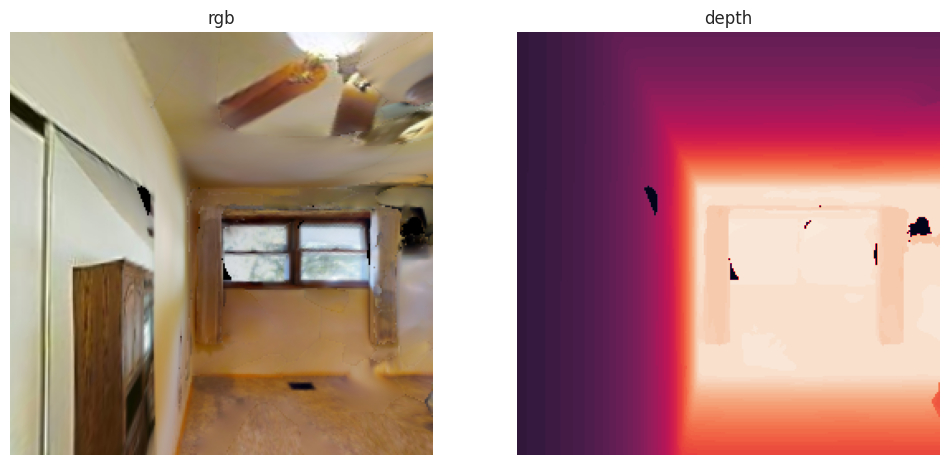

Use WSAD to control the agent now: w
Choose to move_forward


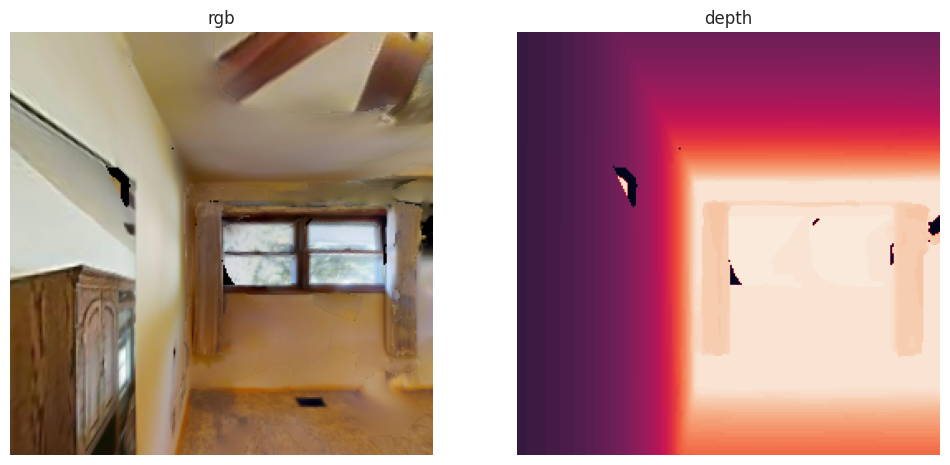

Use WSAD to control the agent now: d
Choose to turn_right


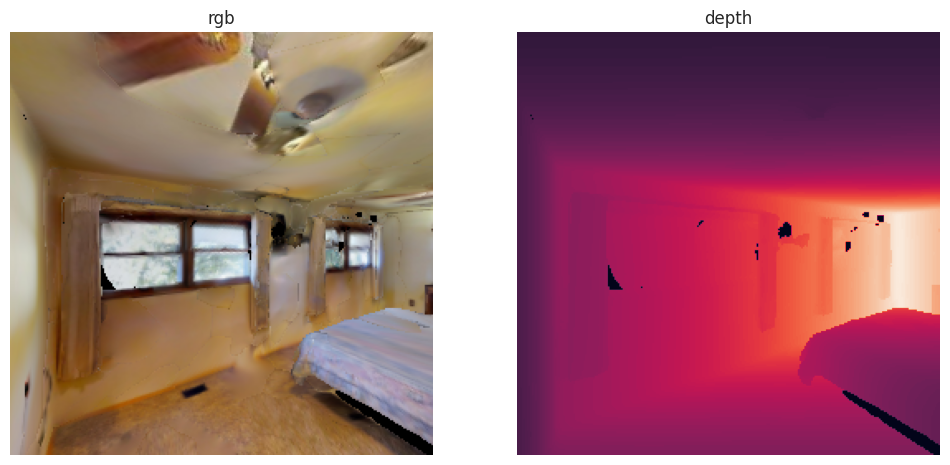

Use WSAD to control the agent now: w
Choose to move_forward


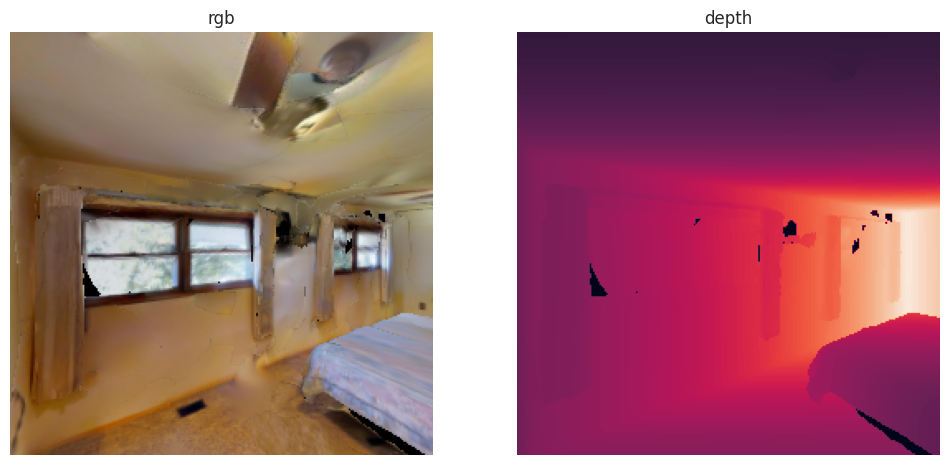

Use WSAD to control the agent now: w
Choose to move_forward


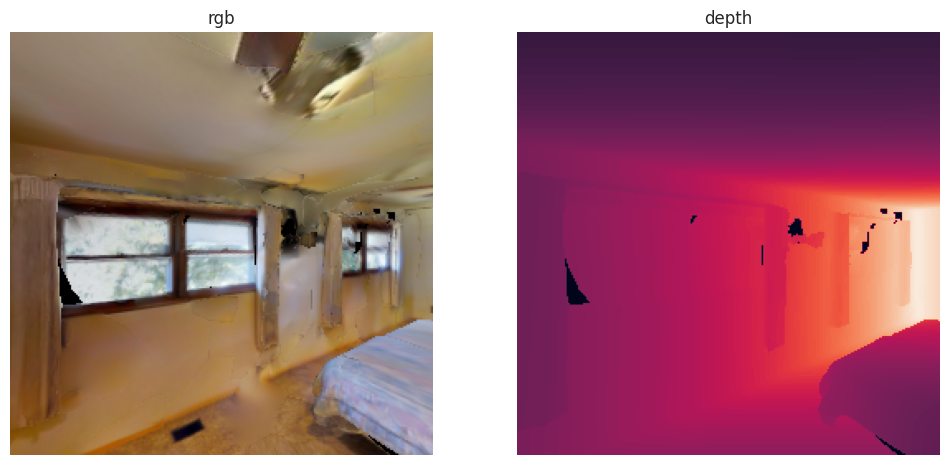

Use WSAD to control the agent now: w
Choose to move_forward


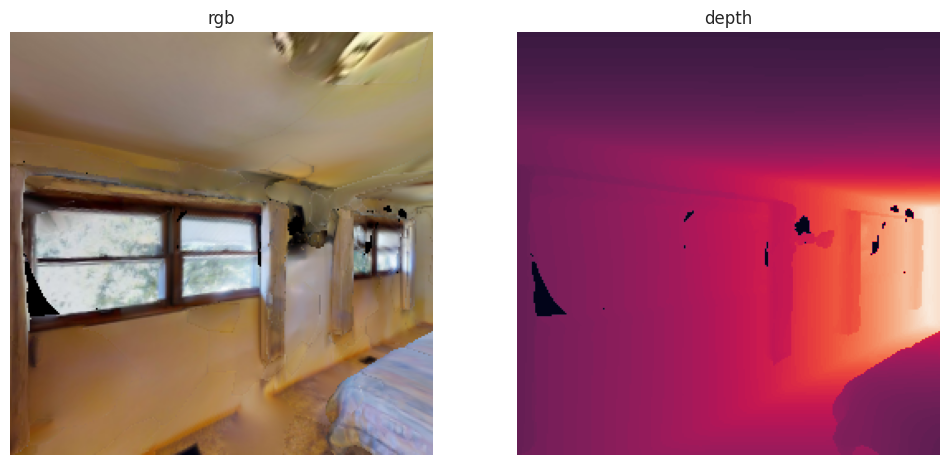

Use WSAD to control the agent now: w
Choose to move_forward


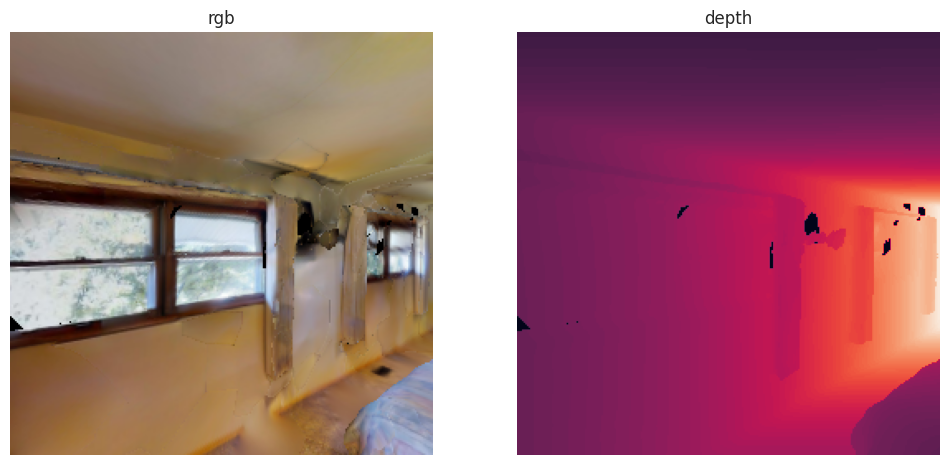

Use WSAD to control the agent now: w
Choose to move_forward


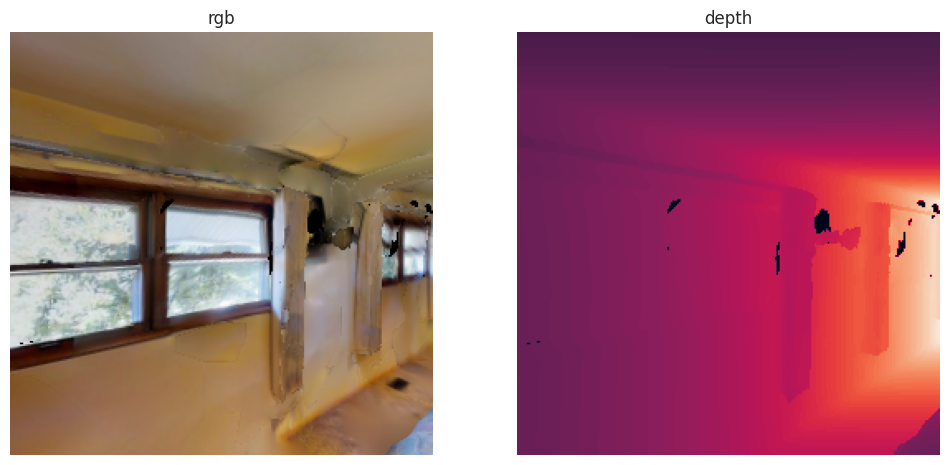

Use WSAD to control the agent now: w
Choose to move_forward


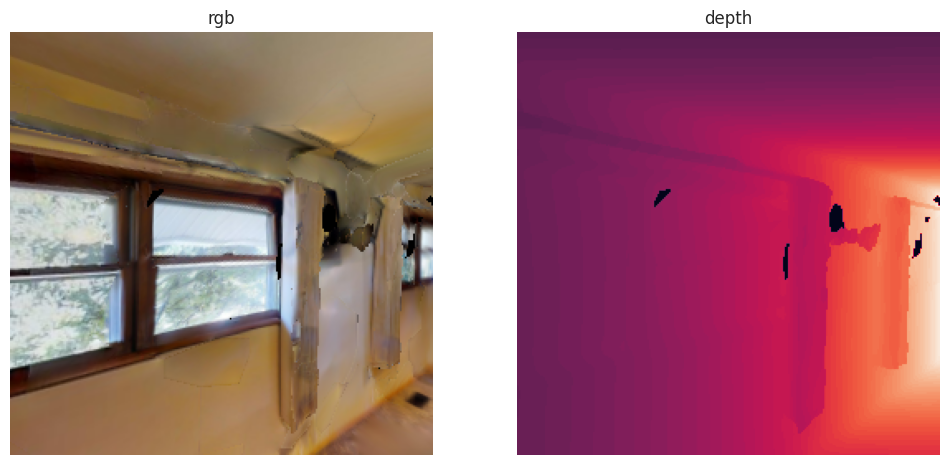

Use WSAD to control the agent now: w
Choose to move_forward


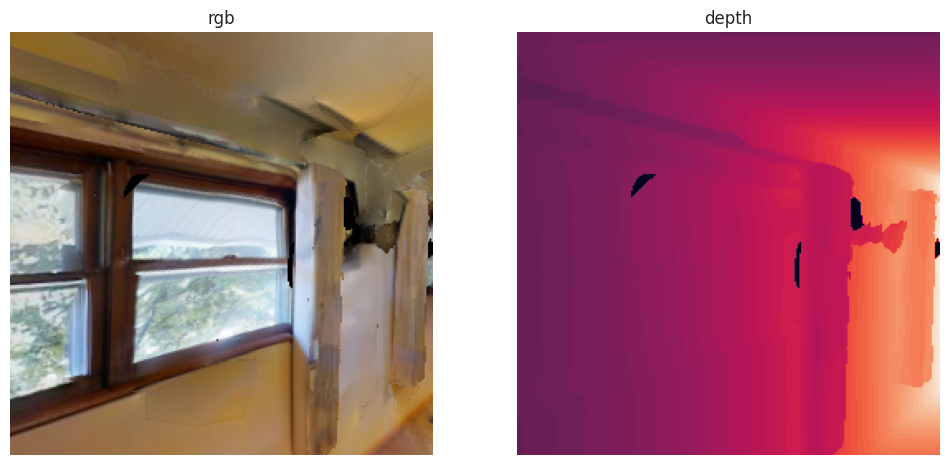

Use WSAD to control the agent now: d
Choose to turn_right


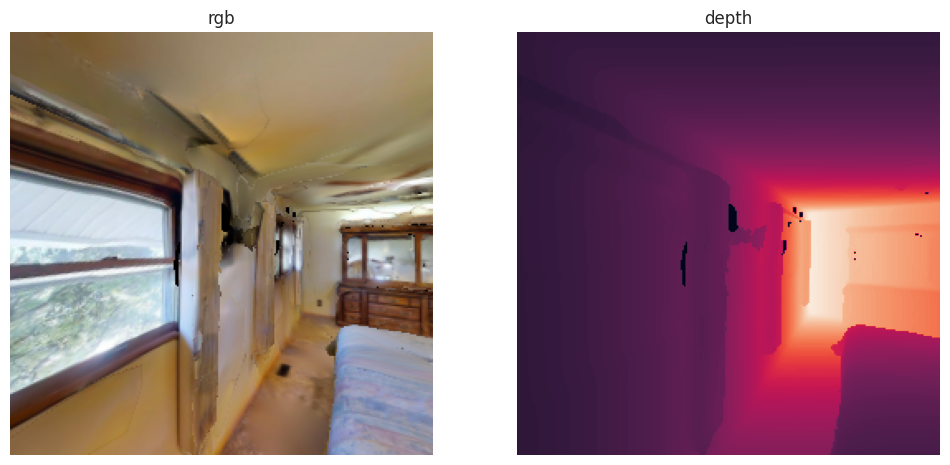

Use WSAD to control the agent now: w
Choose to move_forward


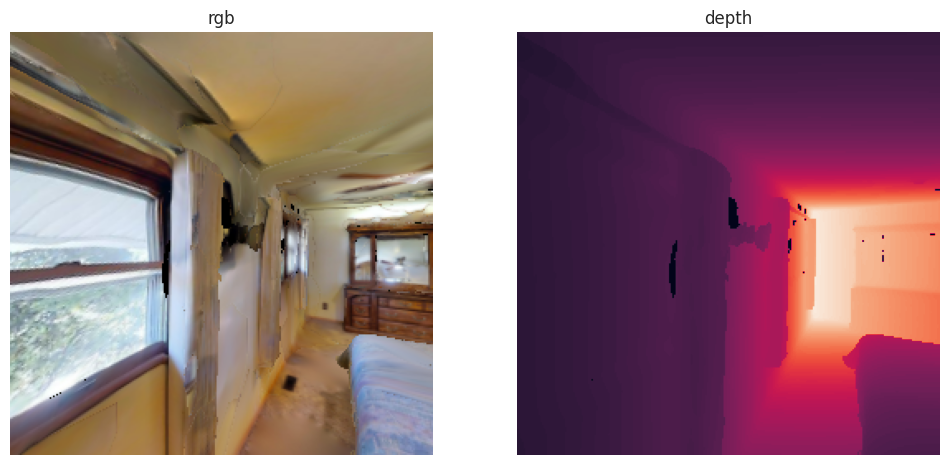

Use WSAD to control the agent now: d
Choose to turn_right


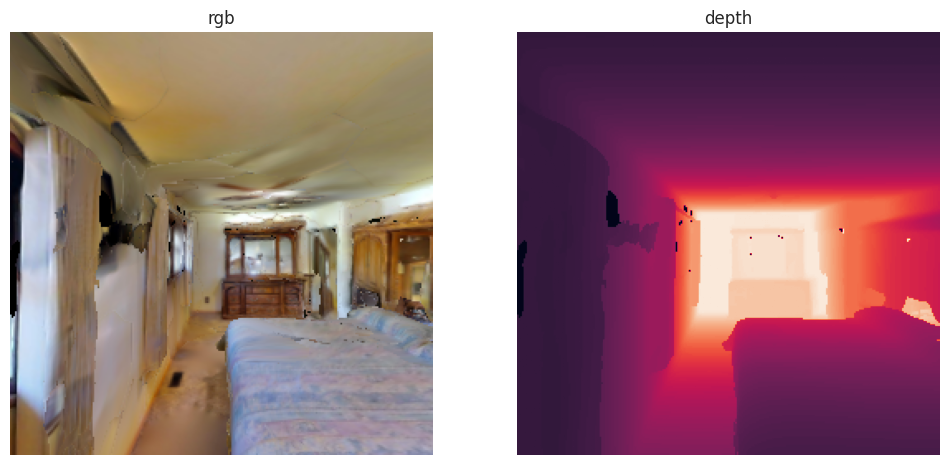

Use WSAD to control the agent now: w
Choose to move_forward


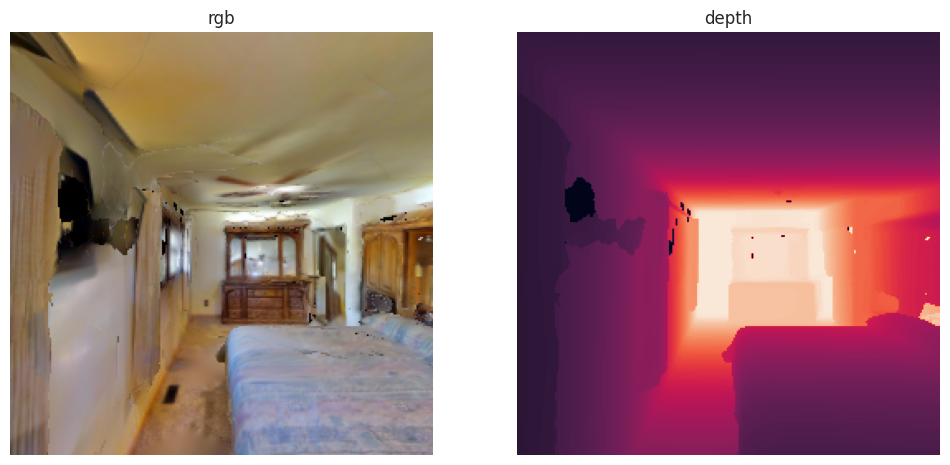

Use WSAD to control the agent now: a
Choose to turn_left


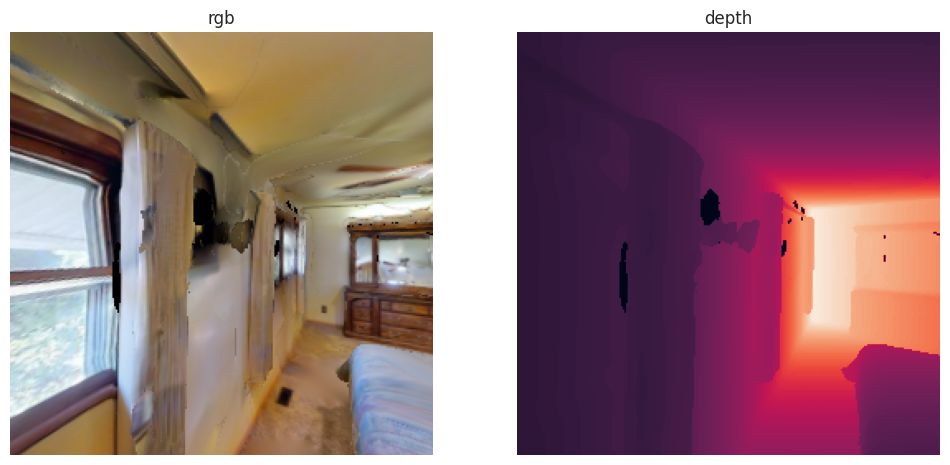

Use WSAD to control the agent now: w
Choose to move_forward


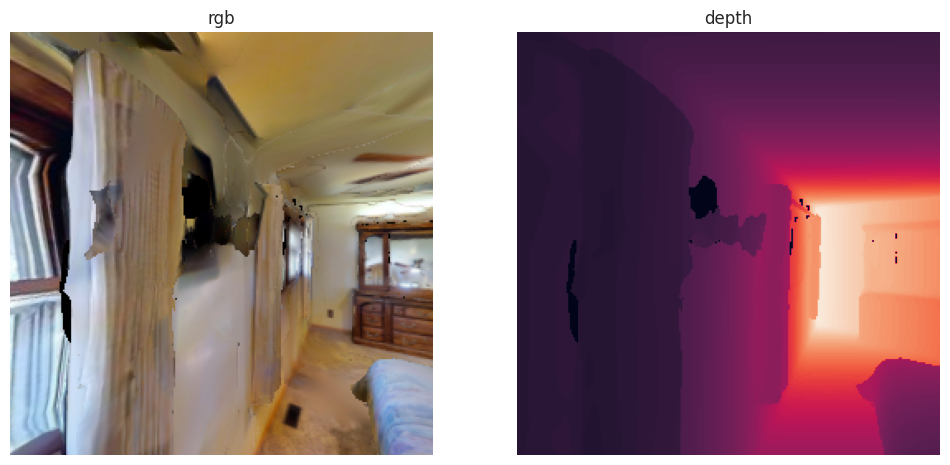

Use WSAD to control the agent now: w
Choose to move_forward


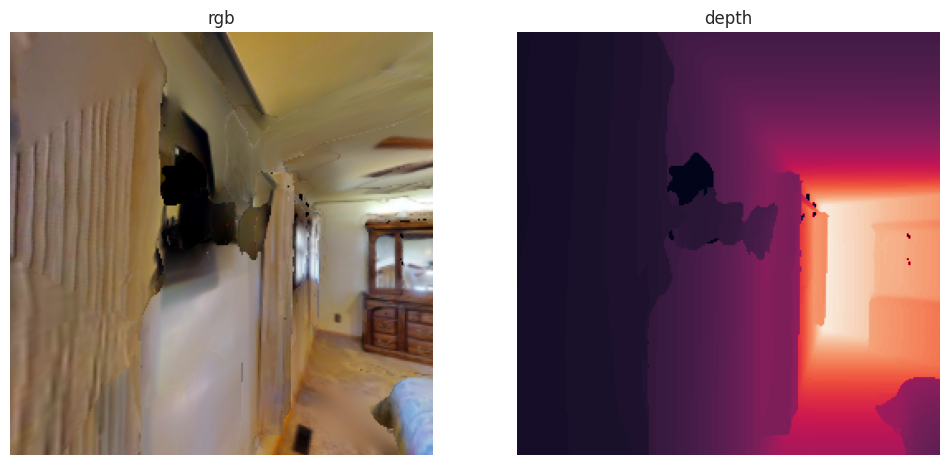

Use WSAD to control the agent now: d
Choose to turn_right


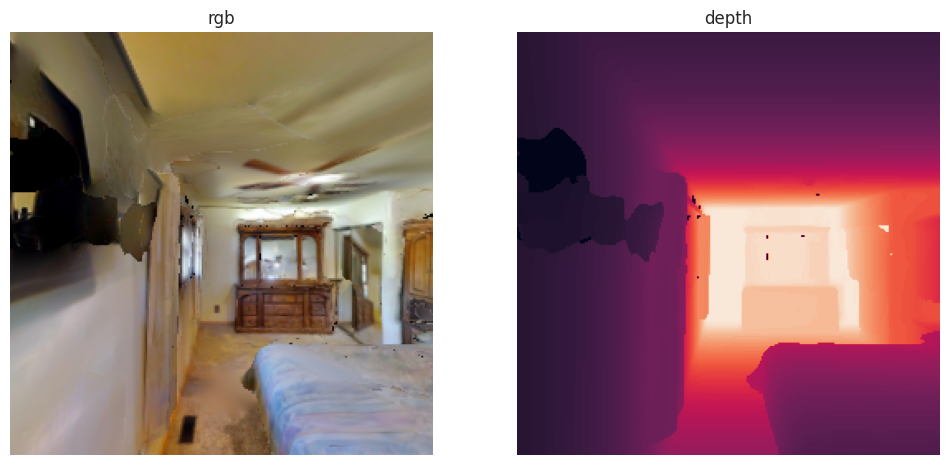

Use WSAD to control the agent now: w
Choose to move_forward


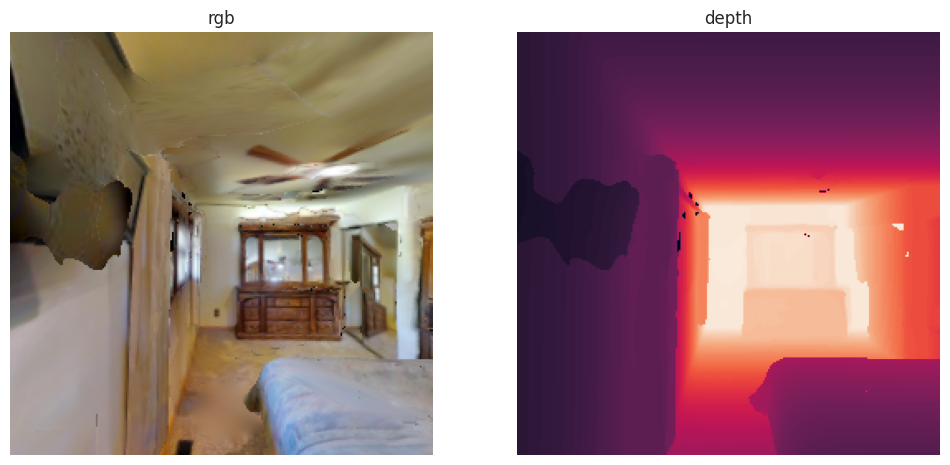

Use WSAD to control the agent now: w
Choose to move_forward


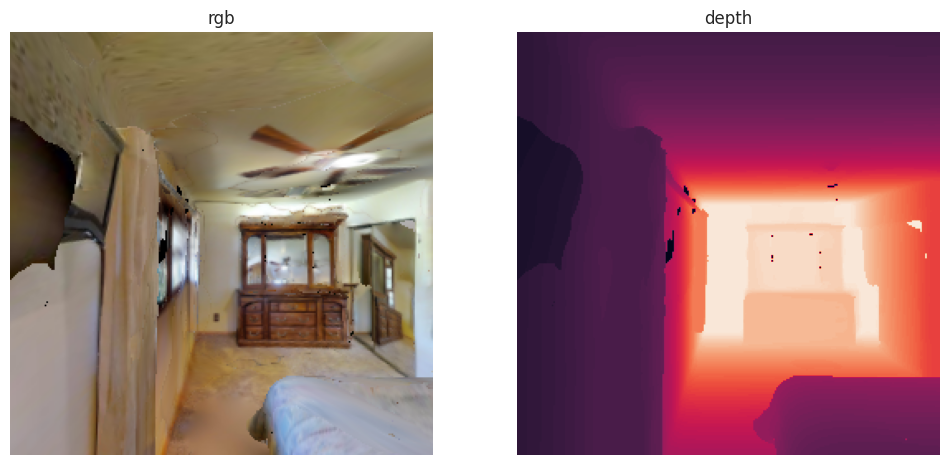

Use WSAD to control the agent now: w
Choose to move_forward


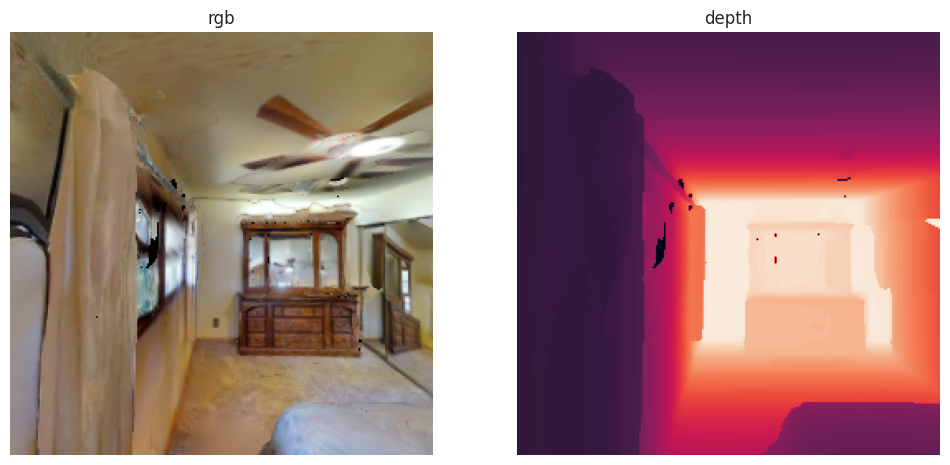

Use WSAD to control the agent now: w
Choose to move_forward


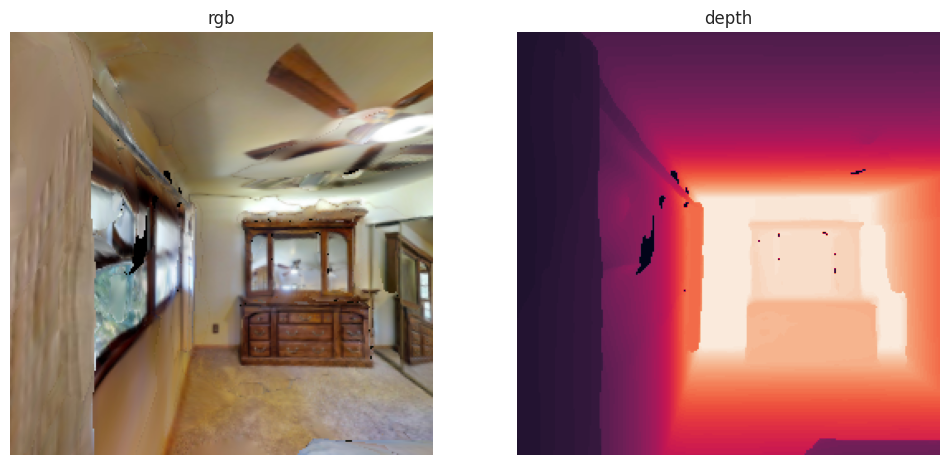

Use WSAD to control the agent now: 
Invalid input . Please only use WSAD!
Use WSAD to control the agent now: w
Choose to move_forward


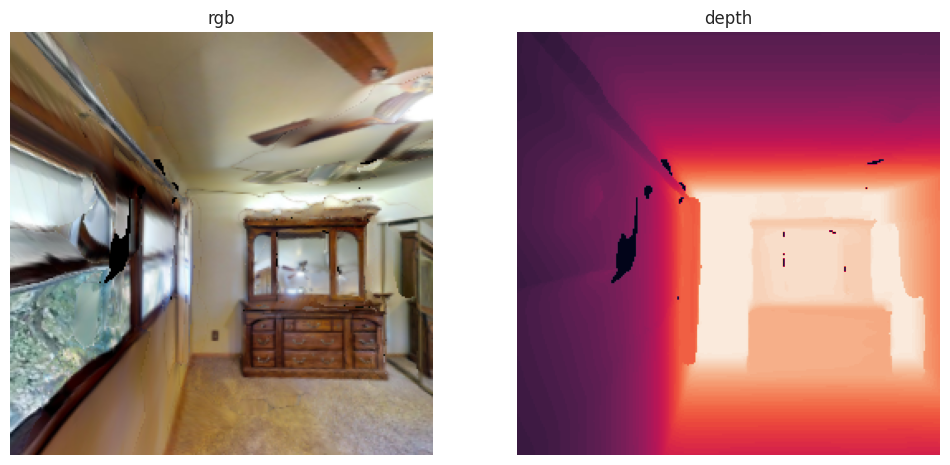

Use WSAD to control the agent now: 
Invalid input . Please only use WSAD!
Use WSAD to control the agent now: w
Choose to move_forward


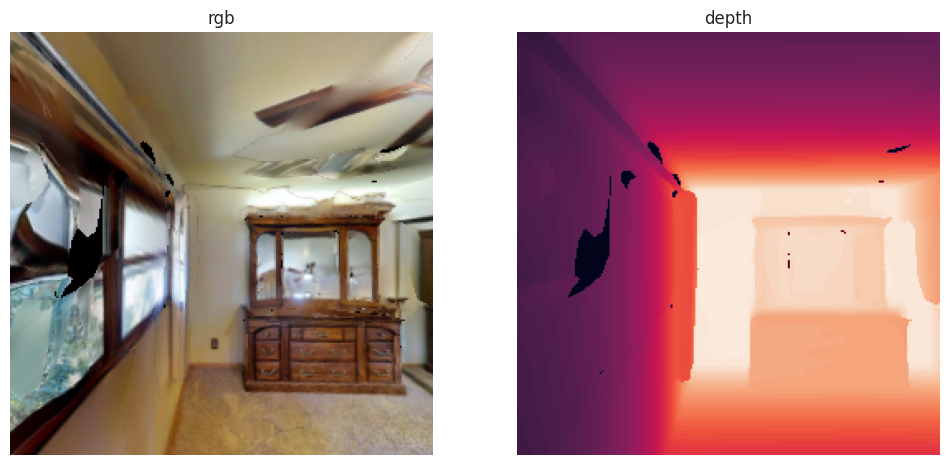

Use WSAD to control the agent now: w
Choose to move_forward


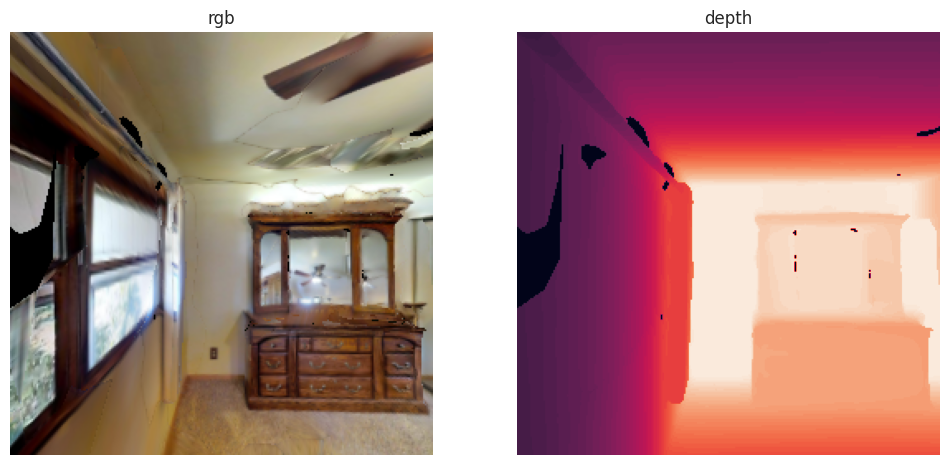

Use WSAD to control the agent now: w
Choose to move_forward


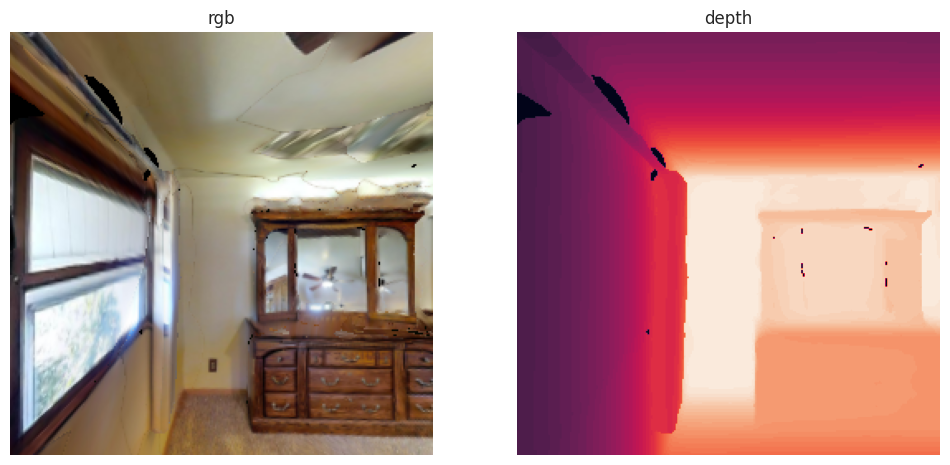

Use WSAD to control the agent now: 
Invalid input . Please only use WSAD!
Use WSAD to control the agent now: w
Choose to move_forward


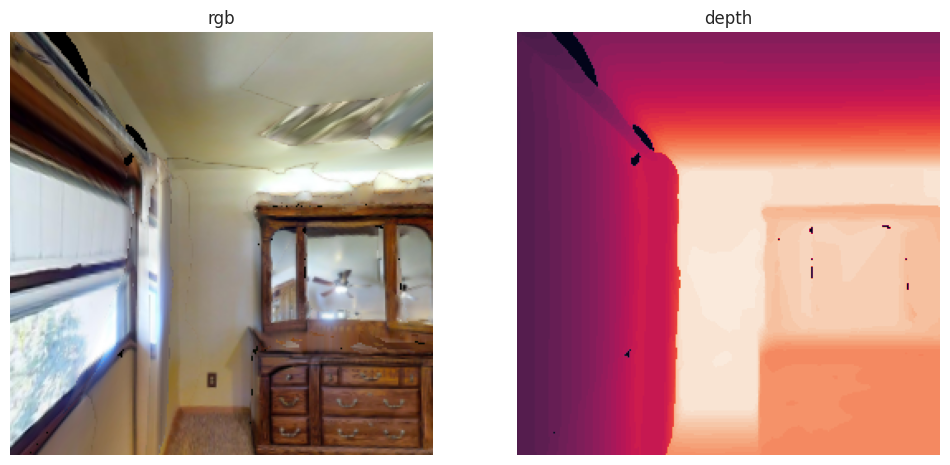

Use WSAD to control the agent now: d
Choose to turn_right


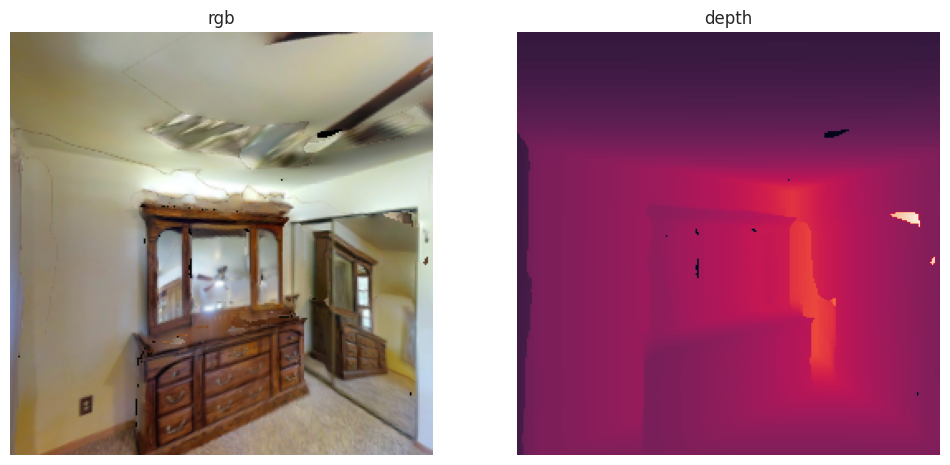

Use WSAD to control the agent now: d
Choose to turn_right


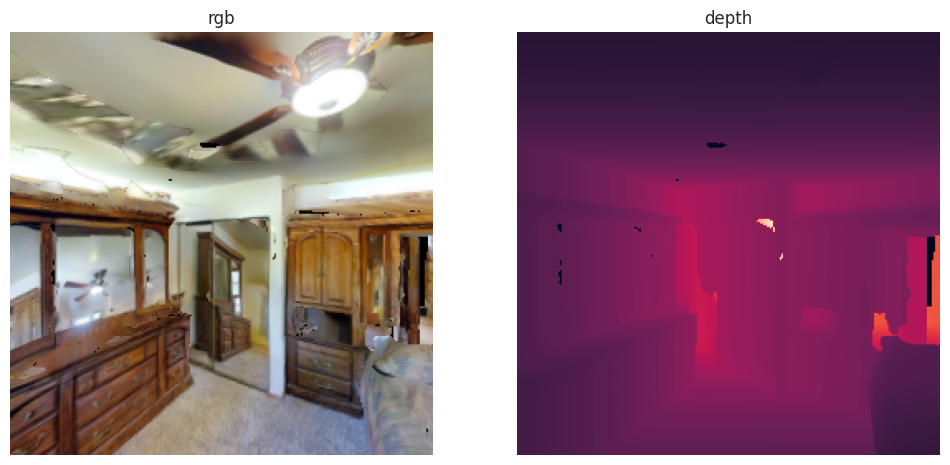

Use WSAD to control the agent now: w
Choose to move_forward


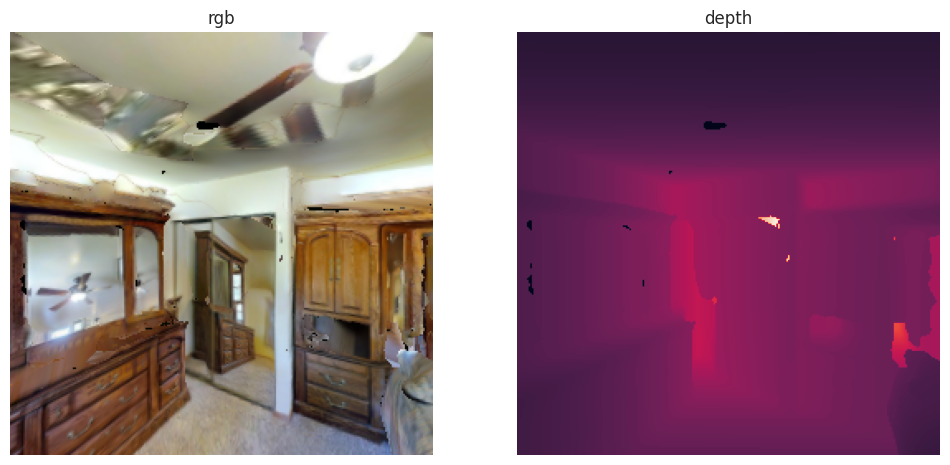

Use WSAD to control the agent now: w
Choose to move_forward


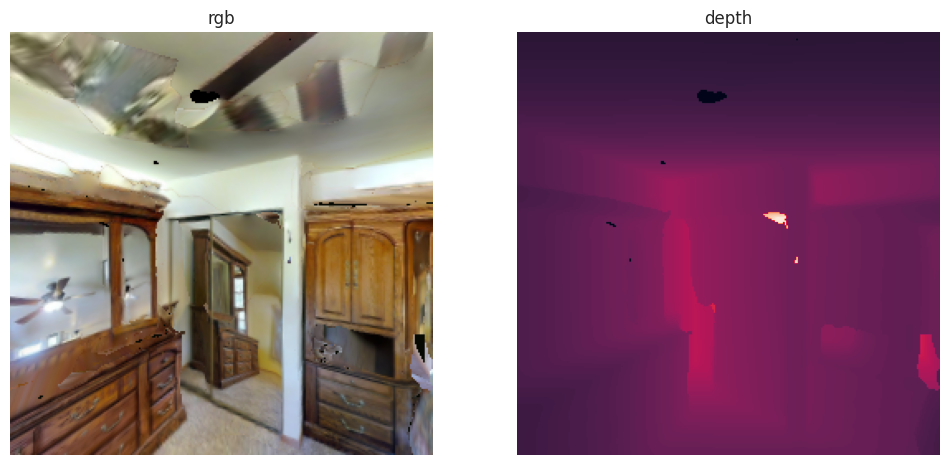

Use WSAD to control the agent now: d
Choose to turn_right


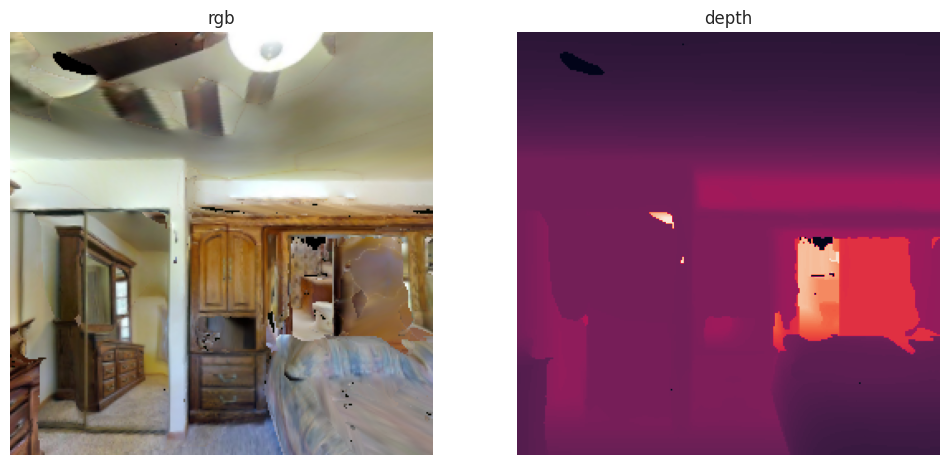

Use WSAD to control the agent now: w
Choose to move_forward


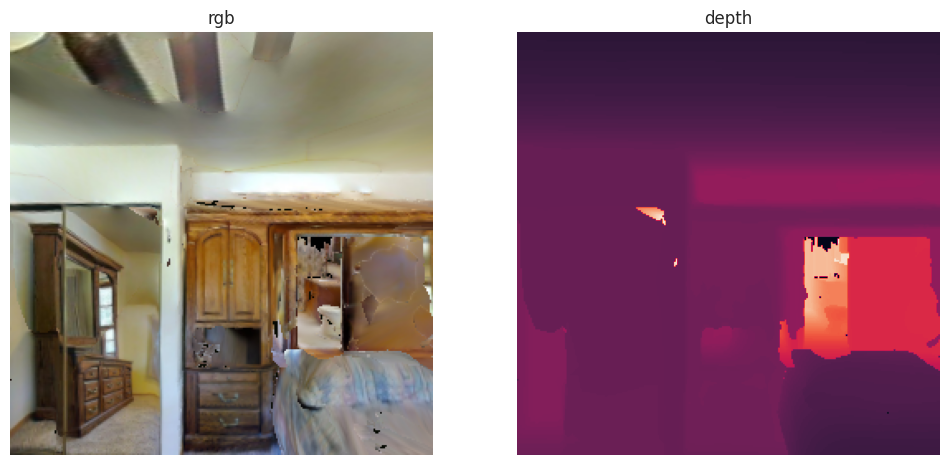

Use WSAD to control the agent now: z
Bye...


In [11]:
key_bindings = {
    'W': 'move_forward',
    'S': 'move_backward',
    'A': 'turn_left',
    'D': 'turn_right',
}
while True:
    key_pressed = input('Use WSAD to control the agent now: ')
    key_pressed = key_pressed.upper()
    if key_pressed == 'Z':
        print("Bye...")
        break
    elif key_pressed in key_bindings.keys():
        action = key_bindings[key_pressed]
        print(f"Choose to {action}")
        observations = sim.step(action)
        rgb_obs = observations["color_sensor"]
        depth_obs = observations["depth_sensor"]

        display_obs(rgb_obs, depth_obs)
    else:
        print(f"Invalid input {key_pressed}. Please only use WSAD!")

# Train a state-based policy
In this section, the embodded agent will only use the GPS+compass in a simple room. Two reinforcement learning algorithms is implemented and compared:
1. Policy Gradient (REINFORCE)
2. Proximal Policy Optimization (PPO)

In [12]:
import random

import numpy as np
from omegaconf import OmegaConf
import torch
import torch.nn.functional as F

from habitat_baselines.config.default import get_config
from habitat_baselines.rl.ppo.ppo_trainer import PPOTrainer

from pg.base_pg import BasePolicyGradient
from pg.base_pg_trainer import BasePolicyGradientTrainer

## REINFORCE
REINFORCE is an on-policy reinforcement learning algorithm. The update process could be desribe as follow:
1. Initialize the policy parameters $\theta$
2. Collect rollouts with policy $\pi_\theta$: $(s_0, a_0, r_0, s_1, a_1, \cdots, s_T)$
3. For $t=T, T-1, \cdots, 1$,
    1. Calculate the return $R_t$
    2. Update the policy parameters $\theta=\theta+\alpha R_t\nabla_\theta \log(\pi_\theta(a_t|s_t))$, where $\alpha$ is a learning rate.

In [13]:
class REINFORCE(BasePolicyGradient):
    def _compute_action_loss(
            self,
            advantages: torch.Tensor,  # Advantage, A_t
            returns: torch.Tensor,  # Return, R_t
            action_log_probs: torch.Tensor,  # Log action probability, log(pi(a_t|s_t))
            values: torch.Tensor  # Value prediction, V_t
    ):
        action_loss = torch.zeros_like(values)
        deltas = returns - values
        assert action_log_probs.size() == advantages.size(
        ), f"This is the action_log_probs size: {action_log_probs.size()} and advantage size: {advantages.size()}"
        action_loss = - advantages * action_log_probs
        action_loss = action_loss.mean()

        return action_loss

    def _compute_value_loss(
            self,
            advantages: torch.Tensor,  # Advantage, A_t
            returns: torch.Tensor,  # Return, R_t
            action_log_probs: torch.Tensor,  # Log action probability, log(pi(a_t|s_t))
            values: torch.Tensor  # Value prediction, V_t
    ):
        value_loss = torch.zeros_like(values)
        deltas = returns - values
        value_loss = deltas.pow(2).mean()

        return value_loss

class REINFORCETrainer(BasePolicyGradientTrainer):
    def _agent_type(self):
        return REINFORCE

In [14]:
# A function to build configuration for REINFORCE training
def build_REINFORCE_config():
    config = get_config("pointnav/ppo_pointnav.yaml")
    # Change for REINFORCE
    OmegaConf.set_readonly(config, False)
    config.habitat_baselines.checkpoint_folder = "data/REINFORCE_checkpoints"
    config.habitat_baselines.tensorboard_dir = "tb/REINFORCE"
    config.habitat_baselines.num_updates = -1
    config.habitat_baselines.num_environments = 2
    config.habitat_baselines.verbose = False
    config.habitat_baselines.num_checkpoints = -1
    config.habitat_baselines.checkpoint_interval = 1000000
    config.habitat_baselines.total_num_steps = 150 * 1000
    config.habitat_baselines.force_blind_policy = True
    config.habitat_baselines.rl.ppo.use_gae = False  # Use Monte-Carlo estimation for returns
    config.habitat.dataset.data_path="data/datasets/pointnav/simple_room/v0/{split}/empty_room.json.gz"
    OmegaConf.set_readonly(config, True)

    return config

## Proximal Policy Optimization (PPO)

In [15]:
# A function to build configuration for PPO training
def build_PPO_config():
    config = get_config("pointnav/ppo_pointnav.yaml")
    # Change for REINFORCE
    OmegaConf.set_readonly(config, False)
    config.habitat_baselines.checkpoint_folder = "data/PPO_checkpoints"
    config.habitat_baselines.tensorboard_dir = "tb/PPO"
    config.habitat_baselines.num_updates = -1
    config.habitat_baselines.num_environments = 2
    config.habitat_baselines.verbose = False
    config.habitat_baselines.num_checkpoints = -1
    config.habitat_baselines.checkpoint_interval = 1000000
    config.habitat_baselines.total_num_steps = 150 * 1000
    config.habitat_baselines.force_blind_policy = True
    config.habitat.dataset.data_path="data/datasets/pointnav/simple_room/v0/{split}/empty_room.json.gz"
    OmegaConf.set_readonly(config, True)

    return config

# Reward definition

The agent is usually equipped with a RGB camera, a depth camera, and an idealized (❓) GPS+compass sensor. The GPS+compass sensor provides the distance and direction towards the target.

The reward used for training the agent contains 3 components:
1. slack reward
    $$
    r_t^\text{slack}=-0.01
    $$
2. progressed distance to goal reward
    $$
    r_t^\text{progressed distance}=r_{t-1}-r_{t}
    $$
    where $r_{t}$ is the geodesic distance to the goal (i.e., shortest path length to the goal) at time $t$.
3. success reward
    $$
    r_t^\text{success}=
    \begin{cases}
    2.5,& \text{if reach goal}\\
    0,  & \text{otherwise}
    \end{cases}
    $$

## Imports package

In [16]:
import os
import random
from typing import Dict, List

import imageio
import matplotlib.pyplot as plt
import numpy as np
from omegaconf import OmegaConf
from omegaconf.dictconfig import DictConfig
import torch
import torch.nn as nn
import tqdm

from habitat import VectorEnv
from habitat.utils.render_wrapper import overlay_frame
from habitat.utils.visualizations.utils import observations_to_image
from habitat_baselines.common.baseline_registry import baseline_registry
from habitat_baselines.common.construct_vector_env import construct_envs
from habitat_baselines.config.default import get_config
from habitat_baselines.utils.common import (
    batch_obs,
    inference_mode,
)
from habitat_baselines.rl.ppo import PPO

os.environ['MAGNUM_LOG'] = 'quiet'
os.environ['HABITAT_SIM_LOG'] = 'quiet'

## Setup
Rather than specifying the configurations on-the-fly in Habitat-Sim, the configurations can be loaded from a `yaml` file in Habitat-Lab.

In [17]:
# A function to build the evaluation config for the trained agent
def build_pretrained_config(data_path: str):
    config = get_config("pointnav/ppo_pointnav.yaml")  # Extract config from yaml
    # Change for evaluation
    OmegaConf.set_readonly(config, False)
    config.habitat_baselines.eval_ckpt_path_dir="./data/checkpoints/gibson.pth"  # Choose checkpoint
    config.habitat_baselines.num_updates = -1
    config.habitat_baselines.num_environments = 1
    config.habitat_baselines.verbose = False
    config.habitat.dataset.data_path = data_path
    OmegaConf.set_readonly(config, True)

    return config

sample_config = build_pretrained_config("data/datasets/pointnav/gibson/v1/val/val_cantwell.json.gz")

## Build environment
Build a vectorized envrionment from the configuration.

In [18]:
# A function to build a vectorized environment
def build_env(config: DictConfig, multiprocess=True):
    if not multiprocess:
        import os
        os.environ['HABITAT_ENV_DEBUG'] = '1'
    return construct_envs(
        config=config,
        workers_ignore_signals=False,
        enforce_scenes_greater_eq_environments=True,
    )

sample_env = build_env(config=sample_config)

2023-07-16 16:00:47,493 Initializing dataset PointNav-v1
2023-07-16 16:00:56,878 Initializing dataset PointNav-v1
2023-07-16 16:00:56,880 initializing sim Sim-v0
2023-07-16 16:00:59,933 Initializing task Nav-v0


## Build actor-critic and agent
Load the actor-critic and agent.

In [19]:
# A function to load the pretrained agent
def build_agent(config: DictConfig, env: VectorEnv, device: torch.device):
    ppo_cfg = config.habitat_baselines.rl.ppo  # Extract config for PPO

    policy = baseline_registry.get_policy(
        config.habitat_baselines.rl.policy.name
    )
    observation_space = env.observation_spaces[0]
    policy_action_space = env.action_spaces[0]
    orig_policy_action_space = env.orig_action_spaces[0]

    actor_critic = policy.from_config(  # Build the actor-critic
        config,
        observation_space,
        policy_action_space,
        orig_action_space=orig_policy_action_space,
    )
    actor_critic.to(device)

    agent = PPO.from_config(  # Build the PPO agent
        actor_critic=actor_critic,
        config=ppo_cfg,
    )

    ckpt_dict = torch.load(config.habitat_baselines.eval_ckpt_path_dir, map_location="cuda")  # Load the checkpoint
    agent.load_state_dict(ckpt_dict["state_dict"])

    actor_critic.eval()
    agent.eval()

    return actor_critic, agent

sample_device = torch.device("cuda")
sample_actor_critic, sample_agent = build_agent(config=sample_config, env=sample_env, device=sample_device)


## Build variables
Since the agent loaded is a recurrent policy, some auxiliary variables that will be taken as input by the policy have to be built.

In [20]:
# A function to build auxiliary variables for the policy
def build_variables(config: DictConfig, actor_critic: nn.Module, device: torch.device):
    test_recurrent_hidden_states = torch.zeros(  # Hidden recurrent state
        config.habitat_baselines.num_environments,
        actor_critic.num_recurrent_layers, 
        config.habitat_baselines.rl.ppo.hidden_size, 
        device=device
    )
    prev_actions = torch.zeros(  # Previous action
        config.habitat_baselines.num_environments,
        1,
        device=device,
        dtype=torch.long,
    )
    not_done_masks = torch.zeros(
        config.habitat_baselines.num_environments,
        1,
        device=device,
        dtype=torch.bool,
    )

    return test_recurrent_hidden_states, prev_actions, not_done_masks

sample_test_recurrent_hidden_states, sample_prev_actions, sample_not_done_masks = build_variables(
    config=sample_config, 
    actor_critic=sample_actor_critic, 
    device=sample_device
)


## Evaluation metrics
The performance of indoor navigation is evaluated with the following metrics:
1. success: `bool`
2. success weighted by path length (SPL): `float`
    $$
    SPL=S\frac{L}{\max(P, L)}
    $$
    where $S$ is 1 or 0 indicating success or not, $P$ is the length of the agent's path, and $L$ is the length of the shortest path from the start point to the goal point (not necessariy the straight line between the start point and the goal point)
3. undiscounted return: `float`


## Embodded agent driven by RGB+Depth+GPS+Compass, using PPO 

In [21]:
# A function to map observations to actions using the pretained agent
def step_agent(actor_critic: nn.Module, batch: Dict[str, torch.Tensor], test_recurrent_hidden_states: torch.Tensor, prev_actions: torch.Tensor, not_done_masks: torch.Tensor):
    with inference_mode():
        (
            _,
            actions,
            _,
            test_recurrent_hidden_states,
        ) = actor_critic.act(
            batch,
            test_recurrent_hidden_states,
            prev_actions,
            not_done_masks,
            deterministic=False,
        )

        prev_actions.copy_(actions)  # type: ignore

    return actions, test_recurrent_hidden_states


# A function to excecute simulation within the environment
def step_env(env: VectorEnv, actions: torch.Tensor):
    step_data = [a.item() for a in actions.cpu()]
    outputs = env.step(step_data)

    observations, rewards_l, dones, infos = [
        list(x) for x in zip(*outputs)
    ]
    
    return observations, rewards_l, dones, infos


# A utility function to post-process the results
def post_process(observations: List[Dict], dones: List[bool], device: torch.device):
    batch = batch_obs(  # type: ignore
        observations,
        device=device,
    )

    not_done_masks = torch.tensor(
        [[not done] for done in dones],
        dtype=torch.bool,
        device=device,
    )

    return batch, not_done_masks


# A utility function to collect rewards in an episode
def collect_rewards(rewards_l: List[float], ep_rewards: List[float]):
    rewards = torch.tensor(
        rewards_l, dtype=torch.float, device="cpu"
    ).unsqueeze(1)
    ep_rewards.append(rewards[0].item())


# A utility function to collect frames in an episode
def collect_frames(batch: Dict[str, torch.Tensor], infos: List[Dict], not_done_masks: torch.Tensor, ep_frames: List[np.ndarray]):
    frame = observations_to_image(
        {k: v[0] for k, v in batch.items()}, infos[0]
    )
    if not not_done_masks[0].item():
        # The last frame corresponds to the first frame of the next episode
        # but the info is correct. So we use a black frame
        frame = observations_to_image(
            {k: v[0] * 0.0 for k, v in batch.items()}, infos[0]
        )
    frame = overlay_frame(frame, infos[0])
    ep_frames.append(frame)


# A utility function to generate video from collected frames
def generate_video(ep_frames: List[np.ndarray], video_name: str, output_dir: str = "output_video", fps: int = 10):
    output_dir = output_dir.lower().replace(" ", "_")
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    video_name = video_name.lower().replace(" ", "_")
    
    writer = imageio.get_writer(
        os.path.join(output_dir, video_name),
        fps=fps
    )

    frames_iter = tqdm.tqdm(ep_frames)
    for fm in frames_iter:
        writer.append_data(fm)
    writer.close()


In [22]:
def loop_env(config: DictConfig, scene_name: str, agent_name: str, add_drift: bool = False, drift_func = None):
    # Set the randomness requried later
    random.seed(config.habitat.seed)
    np.random.seed(config.habitat.seed)
    torch.manual_seed(config.habitat.seed)

    # Choose device for cuda or cpu
    device = torch.device("cuda", config.habitat_baselines.torch_gpu_id) if torch.cuda.is_available() else torch.device("cpu")

    # Build the vectorized environment
    env = build_env(config=config)

    # Build the actor-critic and agent from a checkpoint
    actor_critic, agent = build_agent(config=config, env=env, device=device)

    # Build auxiliary variables
    test_recurrent_hidden_states, prev_actions, not_done_masks = build_variables(
        config=config, 
        actor_critic=actor_critic, 
        device=device
    )

    observations = env.reset()  # Reset the environment, e.g., move the agent back to its start location
    batch = batch_obs(observations, device=device)

    rng = np.random.default_rng()
    sign, scale = None, None

    n_step = 0
    episodes_stats = {}
    ep_rewards, ep_frames = [], []
    while len(episodes_stats) < env.number_of_episodes[0]:
        ep_name = env.current_episodes()[0].episode_id
        actions, test_recurrent_hidden_states = step_agent(  # Map observations to actions
            actor_critic=actor_critic,
            batch=batch,
            test_recurrent_hidden_states=test_recurrent_hidden_states,
            prev_actions=prev_actions,
            not_done_masks=not_done_masks,
        )

        observations, rewards_l, dones, infos = step_env(  # One step forward of simulation in the environment
            env=env,
            actions=actions,
        )
        if add_drift:
            if sign is None:
                sign = rng.choice((-1, 1))  # Direction for drift
                scale = 0.05  # Scale the drift w.r.t. steps
            drift_func(
                observations=observations,
                n_step=n_step,
                sign=sign,
                scale=scale
            )

        batch, not_done_masks = post_process(  # Post-process the results
            observations=observations,
            dones=dones,
            device=device,
        )

        collect_rewards(  # Collect rewards
            rewards_l=rewards_l,
            ep_rewards=ep_rewards,
        )

        collect_frames(  # Collect frames
            batch=batch,
            infos=infos,
            not_done_masks=not_done_masks,
            ep_frames=ep_frames
        )

        n_step += 1
        if not not_done_masks[0].item():  # Episode ended
            last_infos = infos.copy()

            episodes_stats[ep_name] = {
                'success': last_infos[0]['success'],
                'spl': last_infos[0]['spl'],
                'return': sum(ep_rewards),
            }

            # Generate video
            generate_video(
                ep_frames=ep_frames,
                video_name=f"ep={ep_name}_success={last_infos[0]['success']}_spl={last_infos[0]['spl']}.mp4",
                output_dir=f"output_video/{scene_name}/{agent_name}"
            )

            # Clean
            n_step = 0
            ep_rewards, ep_frames = [], []

            # Build auxiliary variables
            test_recurrent_hidden_states, prev_actions, not_done_masks = build_variables(
                config=config, 
                actor_critic=actor_critic, 
                device=device
            )

    success_l, spl_l, return_l = [], [], []
    for ep_stat in episodes_stats.values():
        success_l.append(ep_stat['success'])
        spl_l.append(ep_stat['spl'])
        return_l.append(ep_stat['return'])

    avg_success = sum(success_l) / len(success_l)
    avg_spl = sum(spl_l) / len(spl_l)
    avg_return = sum(return_l) / len(return_l)

    print(f"In {scene_name}, {agent_name}")
    print(f"\t Average success rate: {avg_success}")
    print(f"\t Average SPL: {avg_spl}")
    print(f"\t Average return: {avg_return}")

    return {
        'success': avg_success,
        'spl': avg_spl,
        'return': avg_return
    }


In [23]:
# Build configuration
config = build_pretrained_config("data/datasets/pointnav/gibson/v1/val/val_cantwell.json.gz")

# Start loop env for evaluation
stats_pretrained_cantwell = loop_env(config=config, scene_name='Cantwell', agent_name='Pretrained Agent')

2023-07-16 16:08:27,837 Initializing dataset PointNav-v1
2023-07-16 16:08:36,986 Initializing dataset PointNav-v1
2023-07-16 16:08:36,988 initializing sim Sim-v0
2023-07-16 16:08:40,018 Initializing task Nav-v0
100%|██████████████████████████████████████████| 95/95 [00:00<00:00, 352.34it/s]


In Cantwell, Pretrained Agent
	 Average success rate: 0.8450704225352113
	 Average SPL: 0.6988172601318694
	 Average return: 8.84642204487533


## Drift on GPS and compass measurements
Since the GPS and compass measurements are usually drifted in indoor scenes, here add some simulated drift to GPS and compass measurements and see what will happen.

In [24]:
# A functionn to simulate drift on the GPS and compass measurements
# It adds drift which is a linear function to number of steps
def simulate_drift(observations: List[Dict], n_step: int, sign: int, scale: float):
    rho_drift = sign * n_step * scale
    phi_drift = sign * n_step * np.pi * scale
    observations[0]['pointgoal_with_gps_compass'][0] += rho_drift
    observations[0]['pointgoal_with_gps_compass'][1] += phi_drift
    observations[0]['pointgoal_with_gps_compass'][1] %= 2 * np.pi  # mod
    observations[0]['pointgoal_with_gps_compass'][1] -= np.pi  # map to -pi~pi

In [25]:
# Build the config using a new scene
config = build_pretrained_config("data/datasets/pointnav/gibson/v1/val/val_cantwell.json.gz")

# Start loop env for evaluation
stats_pretrained_drift_cantwell = loop_env(config=config, scene_name='Cantwell', agent_name='Pretrained Agent With Drift', add_drift=True, drift_func=simulate_drift)

2023-07-16 16:11:04,969 Initializing dataset PointNav-v1
2023-07-16 16:11:15,422 Initializing dataset PointNav-v1
2023-07-16 16:11:15,424 initializing sim Sim-v0
2023-07-16 16:11:18,614 Initializing task Nav-v0
100%|██████████████████████████████████████████| 70/70 [00:00<00:00, 332.35it/s]


In Cantwell, Pretrained Agent With Drift
	 Average success rate: 0.0
	 Average SPL: 0.0
	 Average return: 1.8767876416234903


### **Conlusion and Discuss** 

1. Both average success rate and average SPL drop to zero, and average return also decreases from 8.846 to 1.876. It seems that adding drift makes agent fail to reach the goal.
2. The main part of the current reward function (progressed distance to goal reward) is highly related to information provided by GPS and compass rather than vision, which mainly provides surrounding scenarios of the agent.

# Control Baselines
Put its performance into a context and introduce the following control baselines:
1. Random walk -- provides the lower bound on the performance
2. Shortest path -- provides the upper bound on the performance

Then evaluate the baselines in two scenes: one is [Cantwell](http://gibsonenv.stanford.edu/models/?id=Cantwell) as used before while the other one is [Edgemere](http://gibsonenv.stanford.edu/models/?id=Edgemere). The topdown map of the two scenes are shown below.

Cantwell             |  Edgemere
:-------------------------:|:-------------------------:
<img src="images/top_down_map_Cantwell.png" alt="Topdown map of Cantwell" width="50%" height="50%"/>  |  <img src="images/top_down_map_Edgemere.png" alt="Topdown map of Edgemere" width="50%" height="50%"/>

## Performance in the the second scene: Edgemere

In [26]:
# Build configuration
config = build_pretrained_config("data/datasets/pointnav/gibson/v1/val/val_edgemere.json.gz")

# Start loop env for evaluation
stats_pretrained_edgemere = loop_env(config=config, scene_name='Edgemere', agent_name='Pretrained Agent')

2023-07-16 16:13:30,584 Initializing dataset PointNav-v1
2023-07-16 16:13:40,344 Initializing dataset PointNav-v1
2023-07-16 16:13:40,346 initializing sim Sim-v0
2023-07-16 16:13:41,271 Initializing task Nav-v0
100%|██████████████████████████████████████████| 39/39 [00:00<00:00, 308.10it/s]


In Edgemere, Pretrained Agent
	 Average success rate: 0.971830985915493
	 Average SPL: 0.8999728726802186
	 Average return: 5.262807225431382


## Random walk
The agent randomly walks in the scene. Here, it randomly chooses the action among `move_forward`(1), `turn_left`(2), and `turn_right`(3). 

In [27]:
# A function to randomly choose an action
def step_random_walk_agent(include_stop=False):
    lower = 0 if include_stop else 1
    return torch.randint(lower, 4, size=(1, 1), dtype=torch.long)


In [28]:
def loop_random_walk_env(config: DictConfig, scene_name: str, agent_name: str):
    # Set the randomness requried later
    random.seed(config.habitat.seed)
    np.random.seed(config.habitat.seed)
    torch.manual_seed(config.habitat.seed)

    # Choose device for cuda or cpu
    device = torch.device("cuda", config.habitat_baselines.torch_gpu_id) if torch.cuda.is_available() else torch.device("cpu")

    # Build the vectorized environment
    env = build_env(config=config)

    observations = env.reset()  # Reset the environment
    batch = batch_obs(observations, device=device)

    n_step = 0
    episodes_stats = {}
    ep_rewards, ep_frames = [], []
    last_info = None
    while len(episodes_stats) < env.number_of_episodes[0]:
        ep_name = env.current_episodes()[0].episode_id
        actions = step_random_walk_agent()  # Randomly choose an action

        observations, rewards_l, dones, infos = step_env(  # One step forward of simulation in the environment
            env=env,
            actions=actions,
        )

        batch, not_done_masks = post_process(  # Post-process the results
            observations=observations,
            dones=dones,
            device=device,
        )

        collect_rewards(  # Collect rewards
            rewards_l=rewards_l,
            ep_rewards=ep_rewards,
        )

        collect_frames(  # Collect frames
            batch=batch,
            infos=infos,
            not_done_masks=not_done_masks,
            ep_frames=ep_frames
        )

        n_step += 1
        if not not_done_masks[0].item():  # Episode ended
            last_infos = infos.copy()

            episodes_stats[ep_name] = {
                'success': last_infos[0]['success'],
                'spl': last_infos[0]['spl'],
                'return': sum(ep_rewards),
            }

            # Generate video
            generate_video(
                ep_frames=ep_frames,
                video_name=f"ep={ep_name}_success={last_infos[0]['success']}_spl={last_infos[0]['spl']}.mp4",
                output_dir=f"output_video/{scene_name}/{agent_name}"
            )

            # Clean
            n_step = 0
            ep_rewards, ep_frames = [], []

    success_l, spl_l, return_l = [], [], []
    for ep_stat in episodes_stats.values():
        success_l.append(ep_stat['success'])
        spl_l.append(ep_stat['spl'])
        return_l.append(ep_stat['return'])

    avg_success = sum(success_l) / len(success_l)
    avg_spl = sum(spl_l) / len(spl_l)
    avg_return = sum(return_l) / len(return_l)

    print(f"In {scene_name}, {agent_name}")
    print(f"\t Average success rate: {avg_success}")
    print(f"\t Average SPL: {avg_spl}")
    print(f"\t Average return: {avg_return}")

    return {
        'success': avg_success,
        'spl': avg_spl,
        'return': avg_return
    }

### Evaluation in Cantwell

In [29]:
# Build configuration
config = build_pretrained_config("data/datasets/pointnav/gibson/v1/val/val_cantwell.json.gz")

# Start loop random walk env for evaluation
stats_random_walk_cantwell = loop_random_walk_env(config=config, scene_name='Cantwell', agent_name='Random Walk Agent')

2023-07-16 16:15:18,962 Initializing dataset PointNav-v1
2023-07-16 16:15:29,286 Initializing dataset PointNav-v1
2023-07-16 16:15:29,288 initializing sim Sim-v0
2023-07-16 16:15:32,339 Initializing task Nav-v0
100%|████████████████████████████████████████| 500/500 [00:01<00:00, 455.76it/s]


In Cantwell, Random Walk Agent
	 Average success rate: 0.0
	 Average SPL: 0.0
	 Average return: -5.225807000498912


### Evaluation in Edgemere

In [33]:
# Build configuration
config = build_pretrained_config("data/datasets/pointnav/gibson/v1/val/val_edgemere.json.gz")

# Start loop random walk env for evaluation
stats_random_walk_edgemere = loop_random_walk_env(config=config, scene_name='Edgemere', agent_name='Random Walk Agent')

2023-07-16 16:21:22,310 Initializing dataset PointNav-v1
2023-07-16 16:21:22,324 Using the debug Vector environment interface. Expect slower performance.
2023-07-16 16:21:22,326 Initializing dataset PointNav-v1
2023-07-16 16:21:22,329 initializing sim Sim-v0
2023-07-16 16:21:23,276 Initializing task Nav-v0
100%|████████████████████████████████████████| 500/500 [00:01<00:00, 488.89it/s]


In Edgemere, Random Walk Agent
	 Average success rate: 0.0
	 Average SPL: 0.0
	 Average return: -5.1230753430035305


## Shortest path
This agent knows the ground truth of map and follows the shortest path towards the target position.

Compare its performance against the agent trained with Reinforcement Learning, and check which one uses fewer steps to arrive at the target position.

In [34]:
from habitat.tasks.nav.shortest_path_follower import ShortestPathFollower


# A function to build the agent that knows the shortest path towards the target
def build_shortest_path_agent(env: VectorEnv):
    # unwrap env
    internal_env = env.call_at(0, function_name='env').env.env._env._env
    sim = internal_env.sim

    follower = ShortestPathFollower(  # Build the shortest path follower
        sim=sim,
        goal_radius=0.1,
        return_one_hot=False,
    )

    return follower, internal_env


# A function to choose the best action from the shortest path follower
def step_shortest_path_agent(follower: ShortestPathFollower, goal_pos: List[float]):
    best_action = follower.get_next_action(goal_pos=goal_pos)

    return torch.tensor([[best_action]], dtype=torch.long)

In [35]:
def loop_shortest_path_env(config: DictConfig, scene_name: str, agent_name: str):
    # Set the randomness requried later
    random.seed(config.habitat.seed)
    np.random.seed(config.habitat.seed)
    torch.manual_seed(config.habitat.seed)

    # Choose device for cuda or cpu
    device = torch.device("cuda", config.habitat_baselines.torch_gpu_id) if torch.cuda.is_available() else torch.device("cpu")

    # Build the vectorized environment without multi-processing
    env = build_env(config=config, multiprocess=False)
    agent, internal_env = build_shortest_path_agent(env=env)

    observations = env.reset()  # Reset the environment
    batch = batch_obs(observations, device=device)

    n_step = 0
    episodes_stats = {}
    ep_rewards, ep_frames = [], []
    while len(episodes_stats) < env.number_of_episodes[0]:
        ep_name = env.current_episodes()[0].episode_id
        actions = step_shortest_path_agent(agent, goal_pos=internal_env.current_episode.goals[0].position)  # Choose the optimal action towards the target

        observations, rewards_l, dones, infos = step_env(  # One step forward of simulation in the environment
            env=env,
            actions=actions,
        )

        batch, not_done_masks = post_process(  # Post-process the results
            observations=observations,
            dones=dones,
            device=device,
        )

        collect_rewards(  # Collect rewards
            rewards_l=rewards_l,
            ep_rewards=ep_rewards,
        )

        collect_frames(  # Collect frames
            batch=batch,
            infos=infos,
            not_done_masks=not_done_masks,
            ep_frames=ep_frames
        )

        n_step += 1
        if not not_done_masks[0].item():  # Episode ended
            last_infos = infos.copy()

            episodes_stats[ep_name] = {
                'success': last_infos[0]['success'],
                'spl': last_infos[0]['spl'],
                'return': sum(ep_rewards),
            }

            # Generate video
            generate_video(
                ep_frames=ep_frames,
                video_name=f"ep={ep_name}_success={last_infos[0]['success']}_spl={last_infos[0]['spl']}.mp4",
                output_dir=f"output_video/{scene_name}/{agent_name}"
            )

            # Clean
            n_step = 0
            ep_rewards, ep_frames = [], []


    success_l, spl_l, return_l = [], [], []
    for ep_stat in episodes_stats.values():
        success_l.append(ep_stat['success'])
        spl_l.append(ep_stat['spl'])
        return_l.append(ep_stat['return'])

    avg_success = sum(success_l) / len(success_l)
    avg_spl = sum(spl_l) / len(spl_l)
    avg_return = sum(return_l) / len(return_l)

    print(f"In {scene_name}, {agent_name}")
    print(f"\t Average success rate: {avg_success}")
    print(f"\t Average SPL: {avg_spl}")
    print(f"\t Average return: {avg_return}")

    return {
        'success': avg_success,
        'spl': avg_spl,
        'return': avg_return
    }

### Evaluation in Cantwell

In [36]:
# Build configuration
config = build_pretrained_config("data/datasets/pointnav/gibson/v1/val/val_cantwell.json.gz")

# Start loop shortest path env for evaluation
stats_shortest_path_cantwell = loop_shortest_path_env(config=config, scene_name='Cantwell', agent_name='Shortest Path Agent')

2023-07-16 16:27:23,185 Initializing dataset PointNav-v1
2023-07-16 16:27:23,200 Using the debug Vector environment interface. Expect slower performance.
2023-07-16 16:27:23,201 Initializing dataset PointNav-v1
2023-07-16 16:27:23,205 initializing sim Sim-v0
2023-07-16 16:27:26,234 Initializing task Nav-v0
100%|██████████████████████████████████████████| 67/67 [00:00<00:00, 258.96it/s]


In Cantwell, Shortest Path Agent
	 Average success rate: 0.971830985915493
	 Average SPL: 0.9647867878100914
	 Average return: 11.027438541716883


### Evaluation in Edgemere

In [37]:
# Build configuration
config = build_pretrained_config("data/datasets/pointnav/gibson/v1/val/val_edgemere.json.gz")

# Start loop shortest path env for evaluation
stats_shortest_path_edgemere = loop_shortest_path_env(config=config, scene_name='Edgemere', agent_name='Shortest Path Agent')

2023-07-16 16:31:38,079 Initializing dataset PointNav-v1
2023-07-16 16:31:38,096 Using the debug Vector environment interface. Expect slower performance.
2023-07-16 16:31:38,098 Initializing dataset PointNav-v1
2023-07-16 16:31:38,101 initializing sim Sim-v0
2023-07-16 16:31:38,918 Initializing task Nav-v0
100%|██████████████████████████████████████████| 43/43 [00:00<00:00, 313.53it/s]


In Edgemere, Shortest Path Agent
	 Average success rate: 1.0
	 Average SPL: 0.9780787785640307
	 Average return: 5.3609017841747475


## Blind (GPS+Compass only) Agent
Previous trained agent takes both RGBD images and GPS+compass measurements as input.
By introducing the drift to the scensors, it is noticable that the agent relies a lot on the GPS+compass measurements.
In this section, estimate *whether vision is useful for navigation*, and use an agent that only uses GPS+compass measurements for navigation.

In [38]:
# A function to build the evaludation config for the GPS+compass only agent
def build_state_only_config(data_path: str):
    config = get_config("pointnav/ppo_pointnav.yaml")
    # Minor change
    OmegaConf.set_readonly(config, False)
    config.habitat_baselines.eval_ckpt_path_dir = "data/checkpoints/gibson_blind.pth"  # Choose blind checkpoint
    config.habitat_baselines.num_updates = -1
    config.habitat_baselines.num_environments = 1
    config.habitat_baselines.verbose = False
    config.habitat_baselines.force_blind_policy = True
    config.habitat.dataset.data_path = data_path
    OmegaConf.set_readonly(config, True)

    return config


### Evaluation in Cantwell

In [39]:
# Build config for state only agent
config = build_state_only_config("data/datasets/pointnav/gibson/v1/val/val_cantwell.json.gz")

# Start loop env for evaluation
stats_blind_cantwell = loop_env(config=config, scene_name='Cantwell', agent_name='Pretrained Agent without Vision')

2023-07-16 16:33:38,921 Initializing dataset PointNav-v1
2023-07-16 16:33:38,936 Using the debug Vector environment interface. Expect slower performance.
2023-07-16 16:33:38,937 Initializing dataset PointNav-v1
2023-07-16 16:33:38,943 initializing sim Sim-v0
2023-07-16 16:33:42,006 Initializing task Nav-v0
100%|██████████████████████████████████████████| 83/83 [00:00<00:00, 350.21it/s]


In Cantwell, Pretrained Agent without Vision
	 Average success rate: 0.352112676056338
	 Average SPL: 0.2230271446971083
	 Average return: 1.9633206207487655


### Evaluation in Edgemere

In [40]:
# Build config for state only agent
config = build_state_only_config("data/datasets/pointnav/gibson/v1/val/val_edgemere.json.gz")

# Start loop env for evaluation
stats_blind_edgemere = loop_env(config=config, scene_name='Edgemere', agent_name='Pretrained Agent without Vision')

2023-07-16 16:36:16,881 Initializing dataset PointNav-v1
2023-07-16 16:36:16,895 Using the debug Vector environment interface. Expect slower performance.
2023-07-16 16:36:16,896 Initializing dataset PointNav-v1
2023-07-16 16:36:16,901 initializing sim Sim-v0
2023-07-16 16:36:17,719 Initializing task Nav-v0
100%|██████████████████████████████████████████| 60/60 [00:00<00:00, 312.21it/s]


In Edgemere, Pretrained Agent without Vision
	 Average success rate: 0.971830985915493
	 Average SPL: 0.621402119491721
	 Average return: 4.896355358012032


In [41]:
import pandas as pd
df = pd.DataFrame(columns=['scene', 'agent', 'success', 'spl', 'return'])
df = pd.concat([
    df, 
    pd.DataFrame({
        'scene': 'Cantwell',
        'agent': 'Shortest Path',
        **stats_shortest_path_cantwell,
    }, index=[0]),
    pd.DataFrame({
        'scene': 'Edgemere',
        'agent': 'Shortest Path',
        **stats_shortest_path_edgemere,
    }, index=[0]),
    pd.DataFrame({
        'scene': 'Cantwell',
        'agent': 'Blind Agent',
        **stats_blind_cantwell,
    }, index=[0]),
    pd.DataFrame({
        'scene': 'Edgemere',
        'agent': 'Blind Agent',
        **stats_blind_edgemere,
    }, index=[0]),
    pd.DataFrame({
        'scene': 'Cantwell',
        'agent': 'Vision Agent',
        **stats_pretrained_cantwell,
    }, index=[0]),
    pd.DataFrame({
        'scene': 'Edgemere',
        'agent': 'Vision Agent',
        **stats_pretrained_edgemere,
    }, index=[0]),
    pd.DataFrame({
        'scene': 'Cantwell',
        'agent': 'Random Walk',
        **stats_random_walk_cantwell,
    }, index=[0]),
    pd.DataFrame({
        'scene': 'Edgemere',
        'agent': 'Random Walk',
        **stats_random_walk_edgemere,
    }, index=[0]),
])

Text(0.5, 1.0, 'Success')

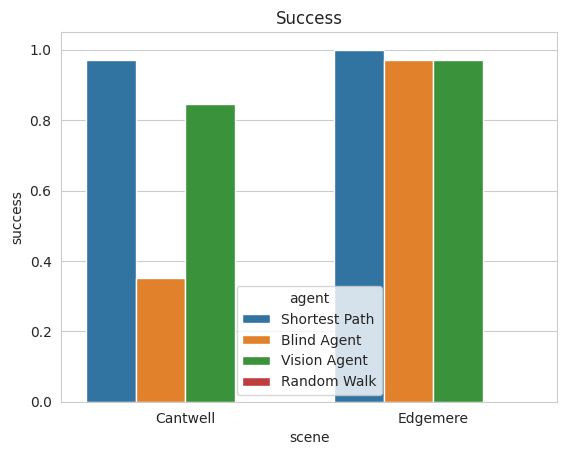

In [42]:
sns.barplot(x='scene', y='success', hue='agent', data=df)
plt.title('Success')

Text(0.5, 1.0, 'SPL')

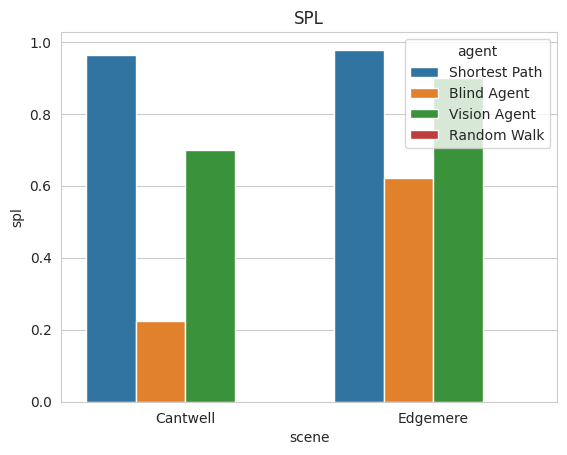

In [43]:
sns.barplot(x='scene', y='spl', hue='agent', data=df)
plt.title('SPL')

### **Conlusion and Discuss** 
1. In general the agent with addiitonal visual signal performs better than the blind agent. In Cantwell, the agent with additional visual signal has higher scores for both SUCCESS and SPL metrics. In Edgemere, the agent with additional visual signal has higher SPL score, but SUCCESS score is the same as the blind agent.
   
2. Visual signal adds additional surrounding information of the agent, so the agent is more likely to reach the goal with more information gathered. Besides, Cantwell is more complicated than Edgemere, which is easier to reveal the advantage of the agent with additional visual signal.

# Compare Policy Gradient (REINFORCE) with Proximal Policy Optimization (PPO)
In this section, train the blind agent (GPS+compass) in a simple room, and compare two reinforcement learning algorithms.

Train Policy Gradient (REINFORCE)

In [44]:
config = build_REINFORCE_config()

# Set randomness
random.seed(config.habitat.seed)
np.random.seed(config.habitat.seed)
torch.manual_seed(config.habitat.seed)
if (
    config.habitat_baselines.force_torch_single_threaded
    and torch.cuda.is_available()
):
    torch.set_num_threads(1)
    
import os
os.environ["MAGNUM_LOG"] = "quiet"
os.environ["HABITAT_SIM_LOG"] = "quiet"

# Build the trainer and start training
trainer = REINFORCETrainer(config)
trainer.train()

2023-07-16 16:37:33,502 Loading resume state: data/REINFORCE_checkpoints/.habitat-resume-state.pth
2023-07-16 16:37:33,530 Initializing dataset PointNav-v1
2023-07-16 16:37:34,107 There are less scenes (1) than environments (2). Each environment will use all the scenes instead of using a subset.
2023-07-16 16:37:34,130 Using the debug Vector environment interface. Expect slower performance.
2023-07-16 16:37:34,131 Initializing dataset PointNav-v1
2023-07-16 16:37:34,132 Initializing dataset PointNav-v1
2023-07-16 16:37:34,661 initializing sim Sim-v0
2023-07-16 16:37:34,688 initializing sim Sim-v0
2023-07-16 16:37:39,407 Initializing task Nav-v0
2023-07-16 16:37:44,166 Initializing task Nav-v0
2023-07-16 16:37:44,730 agent number of parameters: 890661
2023-07-16 16:37:46,318 update: 500	fps: 110.531	
2023-07-16 16:37:46,319 update: 500	env-time: 399.392s	pth-time: 192.911s	frames: 128000
2023-07-16 16:37:46,319 Average window size: 50  distance_to_goal: 17.541  distance_to_goal_reward: 

## PPO
Train a PPO agent

In [45]:
config = build_PPO_config()  # Build the config for PPO

# Set randomness
random.seed(config.habitat.seed)
np.random.seed(config.habitat.seed)
torch.manual_seed(config.habitat.seed)
if (
    config.habitat_baselines.force_torch_single_threaded
    and torch.cuda.is_available()
):
    torch.set_num_threads(1)

import os
os.environ["MAGNUM_LOG"] = "quiet"
os.environ["HABITAT_SIM_LOG"] = "quiet"

# Build the trainer and start training
trainer = PPOTrainer(config)
trainer.train()

2023-07-16 16:39:55,731 Loading resume state: data/PPO_checkpoints/.habitat-resume-state.pth
2023-07-16 16:39:55,756 Initializing dataset PointNav-v1
2023-07-16 16:39:56,292 There are less scenes (1) than environments (2). Each environment will use all the scenes instead of using a subset.
2023-07-16 16:39:56,312 Using the debug Vector environment interface. Expect slower performance.
2023-07-16 16:39:56,313 Initializing dataset PointNav-v1
2023-07-16 16:39:56,314 Initializing dataset PointNav-v1
2023-07-16 16:39:56,597 initializing sim Sim-v0
2023-07-16 16:40:01,546 Initializing task Nav-v0
2023-07-16 16:40:01,711 initializing sim Sim-v0
2023-07-16 16:40:07,045 Initializing task Nav-v0
2023-07-16 16:40:07,094 agent number of parameters: 890661
2023-07-16 16:40:08,101 update: 500	fps: 287.968	
2023-07-16 16:40:08,102 update: 500	env-time: 73.619s	pth-time: 201.308s	frames: 128000
2023-07-16 16:40:08,103 Average window size: 50  distance_to_goal: 0.156  distance_to_goal_reward: 0.000  r

## Comparing the performance of REINFORCE and PPO

In [46]:
from tensorboard.backend.event_processing import event_accumulator
import pandas as pd


def parse_tensorboard(path, scalars, prefix=""):
    """returns a dictionary of pandas dataframes for each requested scalar"""
    ea = event_accumulator.EventAccumulator(
        path,
        size_guidance={event_accumulator.SCALARS: 0},
    )
    _ = ea.Reload()
    df = pd.DataFrame(ea.Scalars(scalars[0]))
    df[f'{scalars[0]}'] = df['value']
    df.drop(columns=['value'], inplace=True)
    for k in scalars:
        df[k] = pd.DataFrame(ea.Scalars(k))['value']
    return df

In [47]:
# Parse the tensorboard logs
reinforce_logs = parse_tensorboard("tb/REINFORCE", ["metrics/spl", "reward", "learner/grad_norm"])
ppo_logs = parse_tensorboard("tb/PPO", ["metrics/spl", "reward", "learner/grad_norm"])

Detected out of order event.step likely caused by a TensorFlow restart. Purging expired events from Tensorboard display between the previous step: -1 (timestamp: -1) and current step: 127744 (timestamp: 1680531365.4655006). Removing 1056 scalars, 0 histograms, 0 compressed histograms, 0 images, and 0 audio.
Detected out of order event.step likely caused by a TensorFlow restart. Purging expired events from Tensorboard display between the previous step: -1 (timestamp: -1) and current step: 127744 (timestamp: 1689506452.363284). Removing 1044 scalars, 0 histograms, 0 compressed histograms, 0 images, and 0 audio.
Detected out of order event.step likely caused by a TensorFlow restart. Purging expired events from Tensorboard display between the previous step: -1 (timestamp: -1) and current step: 127744 (timestamp: 1689506678.2315252). Removing 1044 scalars, 0 histograms, 0 compressed histograms, 0 images, and 0 audio.
Detected out of order event.step likely caused by a TensorFlow restart. Pu

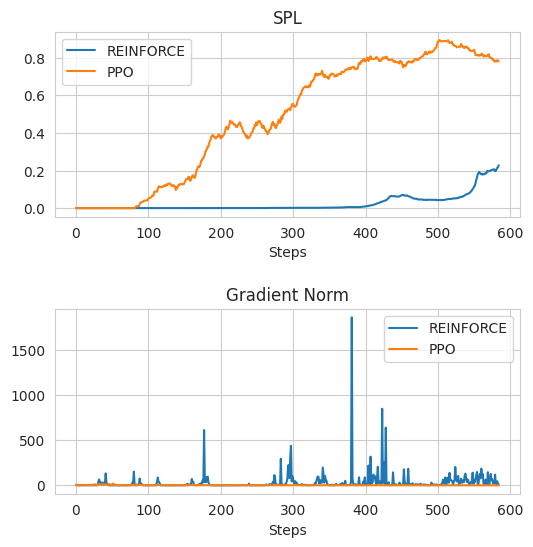

In [48]:


fig, axes = plt.subplots(2, 1, figsize=(6, 6))
plt.subplots_adjust(hspace=0.5)
plt.axes(axes[0])
plt.plot(reinforce_logs['metrics/spl'], label="REINFORCE")
plt.plot(ppo_logs['metrics/spl'], label="PPO")
plt.title("SPL")
plt.xlabel("Steps")
plt.legend()


plt.axes(axes[1])
plt.plot(reinforce_logs['learner/grad_norm'], label="REINFORCE")
plt.plot(ppo_logs['learner/grad_norm'], label="PPO")
plt.title("Gradient Norm")
plt.xlabel("Steps")
plt.legend()

### **Discuss and conclusion** (10 pts)
1. The SPL score of PPO increases faster than REINFORCE, and is always higher. The gradient norm of PPO is always small, but the gradient norm of REINFORCE fluctuates a lot.

2. PPO has an objective clipping step that helps to maintain better gradients.